In [2]:
import numpy as np
import pandas as pd
from math import *
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import os

In [3]:
telecom = pd.read_csv("churn.csv")

In [4]:
telecom.head()

,recordID,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,...,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn,customer_id
0,1,HI,101,510,no,no,0,70.9,123,12.05,...,18.01,236.0,73,10.62,10.6,3,2.86,3,no,23383607.0
1,2,MT,137,510,no,no,0,223.6,86,38.01,...,20.81,94.2,81,4.24,9.5,7,2.57,0,no,22550362.0
2,3,OH,103,408,no,yes,29,294.7,95,50.10,...,20.17,300.3,127,13.51,13.7,6,3.70,1,no,59063354.0
3,4,NM,99,415,no,no,0,216.8,123,36.86,...,10.74,220.6,82,9.93,15.7,2,4.24,1,no,25464504.0
4,5,SC,108,415,no,no,0,197.4,78,33.56,...,10.54,204.5,107,9.20,7.7,4,2.08,2,no,691824.0


Data Overview Training

In [5]:
telecom.shape

(12892, 22)

In [6]:
telecom.columns.tolist()

['recordID',
 'state',
 'account_length',
 'area_code',
 'international_plan',
 'voice_mail_plan',
 'number_vmail_messages',
 'total_day_minutes',
 'total_day_calls',
 'total_day_charge',
 'total_eve_minutes',
 'total_eve_calls',
 'total_eve_charge',
 'total_night_minutes',
 'total_night_calls',
 'total_night_charge',
 'total_intl_minutes',
 'total_intl_calls',
 'total_intl_charge',
 'number_customer_service_calls',
 'churn',
 'customer_id']

In [7]:
print("\nMissing values:", telecom.isnull().sum().values.sum())


Missing values: 0


In [8]:
telecom.nunique()

recordID                         12892
state                               51
account_length                     218
area_code                            3
international_plan                   2
voice_mail_plan                      2
number_vmail_messages               48
total_day_minutes                 1961
total_day_calls                    123
total_day_charge                  1961
total_eve_minutes                 1879
total_eve_calls                    126
total_eve_charge                  1659
total_night_minutes               1853
total_night_calls                  131
total_night_charge                1028
total_intl_minutes                 170
total_intl_calls                    21
total_intl_charge                  170
number_customer_service_calls       10
churn                                2
customer_id                      12892
dtype: int64

In [9]:
from PIL import Image
import seaborn as sns
import itertools
import io
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
%matplotlib inline

In [10]:
trace = go.Pie(
    labels=telecom["churn"].value_counts().keys().tolist(),
    values=telecom["churn"].value_counts().values.tolist(),
    marker=dict(colors=['red', 'green'],
                line=dict(color="white", width=1.3)),
    rotation=90,
    hoverinfo="label+value+text",
    hole=0.3
)

layout = go.Layout(
    title="Customer churn in training data",
    plot_bgcolor="rgb(243,243,243)",
    paper_bgcolor="rgb(243,243,243)",
    height=400,
    width=600
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

Analysing Variable distribution

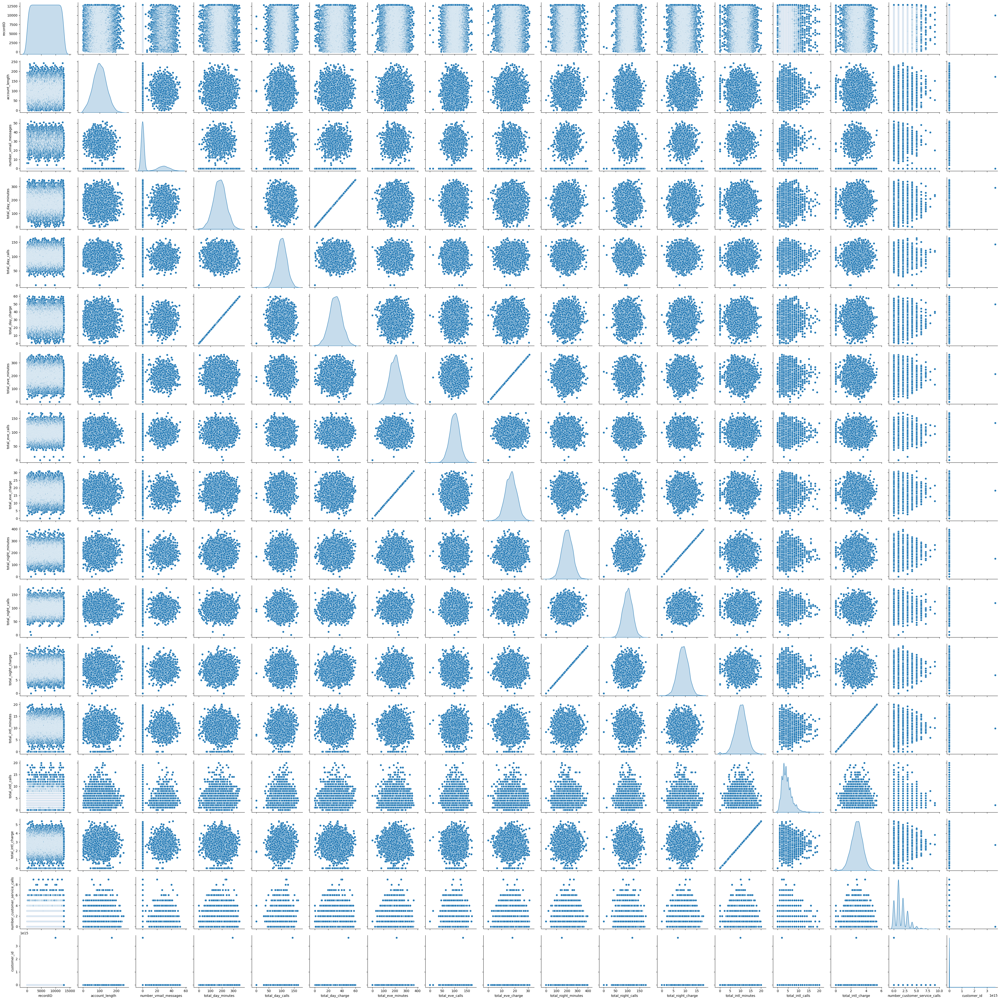

In [11]:
out_cols = list(set(telecom.nunique()[telecom.nunique()<6].keys().tolist()
                    + telecom.select_dtypes(include='object').columns.tolist()))
viz_cols = [x for x in telecom.columns if x not in out_cols] + ['churn']

sns.pairplot(telecom[viz_cols], diag_kind="kde")
plt.show()

In [12]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

In [13]:
#Dropping irrelevant columns
col_to_drop = ['recordID','state', 'area_code', 'total_day_charge', 'total_eve_charge', 
               'total_night_charge', 'total_intl_charge', 'customer_id']

In [14]:
telecom = telecom.drop(columns = col_to_drop, axis = 1)

In [15]:
telecom.shape

(12892, 14)

In [16]:
telecom.columns

Index(['account_length', 'international_plan', 'voice_mail_plan',
       'number_vmail_messages', 'total_day_minutes', 'total_day_calls',
       'total_eve_minutes', 'total_eve_calls', 'total_night_minutes',
       'total_night_calls', 'total_intl_minutes', 'total_intl_calls',
       'number_customer_service_calls', 'churn'],
      dtype='object')

In [17]:
target_col = ["churn"]

In [18]:
nlevels = 6
cat_cols = list(set(telecom.nunique()[telecom.nunique()<nlevels].keys().tolist() 
                    + telecom.select_dtypes(include='object').columns.tolist()))
cat_cols = [x for x in cat_cols if x not in target_col]

In [19]:
num_cols = [x for x in telecom.columns if x not in cat_cols + target_col]

In [20]:
bin_cols = telecom.nunique()[telecom.nunique() == 2].keys().tolist()

In [21]:
multi_cols = [i for i in cat_cols if i not in bin_cols]

In [22]:
le = LabelEncoder()
for i in bin_cols:
    telecom[i] = le.fit_transform(telecom[i])

In [23]:
trainsize = telecom.shape[0]
comb = pd.get_dummies(data = telecom, columns = multi_cols)

In [24]:
telecom = comb[:trainsize]

In [25]:
std = StandardScaler()
scaled = std.fit_transform(telecom[num_cols])
scaled = pd.DataFrame(scaled, columns=num_cols)

In [26]:
df_telecom_og = telecom.copy()
telecom = telecom.drop(columns = num_cols, axis = 1)
telecom = telecom.merge(scaled, left_index=True, right_index=True, how = "left")

In [27]:
summary = (df_telecom_og[[i for i in df_telecom_og.columns]].
           describe().transpose().reset_index())

In [28]:
summary

,index,count,mean,std,min,25%,50%,75%,max
0,account_length,12892.0,100.676621,39.806413,1.0,73.0,100.00,127.0,243.0
1,international_plan,12892.0,0.096261,0.294961,0.0,0.0,0.00,0.0,1.0
2,voice_mail_plan,12892.0,0.273038,0.445537,0.0,0.0,0.00,1.0,1.0
3,number_vmail_messages,12892.0,7.996665,13.641977,0.0,0.0,0.00,19.0,52.0
4,total_day_minutes,12892.0,180.162023,54.207056,0.0,144.0,180.00,216.3,351.5
5,total_day_calls,12892.0,100.266599,19.946657,0.0,87.0,101.00,114.0,165.0
6,total_eve_minutes,12892.0,200.711852,50.781851,0.0,166.2,201.15,234.9,363.7
7,total_eve_calls,12892.0,100.137139,19.894032,0.0,87.0,100.00,114.0,170.0
8,total_night_minutes,12892.0,200.557834,50.632872,0.0,167.0,200.80,235.1,395.0
9,total_night_calls,12892.0,100.038241,19.749714,0.0,87.0,100.00,113.0,175.0


In [29]:
correlation = telecom.corr()
matrix_cols = correlation.columns.tolist()
corr_array = np.array(correlation)
annotations = []
for i in range(len(matrix_cols)):
    for j in range(len(matrix_cols)):
        annotation = go.layout.Annotation(
            text='{:.2f}'.format(corr_array[i][j]),
            x=matrix_cols[i],
            y=matrix_cols[j],
            xref='x1',
            yref='y1',
            showarrow=False,
            font=dict(size=9, color='white'),
        )
        annotations.append(annotation)

trace = go.Heatmap(
    z=corr_array,
    x=matrix_cols,
    y=matrix_cols,
    colorscale="RdBu",
    colorbar=dict(title="Pearson Correlation coefficients", titleside="right"),
)

layout = go.Layout(
    title="Correlation matrix",
    autosize=False,
    height=720,
    width=800,
    margin=dict(r=0, l=210, t=25, b=210),
    yaxis=dict(tickfont=dict(size=9)),
    xaxis=dict(tickfont=dict(size=9)),
    annotations=annotations,
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

Principal Component Analysis (PCA Analysis)

In [30]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 2)
X = telecom[[i for i in telecom.columns if i not in target_col]]
Y = telecom[target_col]
principal_components = pca.fit_transform(X)

In [31]:
def pca_scatter(pcadf, targetfeature, targetlabel, color):
    tracer = go.Scatter(x = pcadf[pcadf[targetfeature]==targetlabel]["PC1"],
                        y = pcadf[pcadf[targetfeature]==targetlabel]["PC2"],
                        name = targetlabel, mode = "markers",
                        marker = dict(color = color, line = dict(width = .5), symbol = "diamond-open"),
                       )
    return tracer

In [32]:
pca_data = pd.DataFrame(principal_components, columns = ["PC1", "PC2"])
pca_data = pca_data.merge(Y, left_index=True, right_index=True, how="left")
pca_data["churn"] = pca_data["churn"].replace({1: "yes", 0: "no"})

layout = go.Layout(dict(title = "Visualizing data with PCA",
                        plot_bgcolor = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "first principal component (PC1)",
                                     zerolinewidth=1, ticklen=5, gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "second principal component (PC2)",
                                     zerolinewidth=1, ticklen=5, gridwidth=2),
                        height = 400,
                        width=800
                       )
                  )

trace1 = pca_scatter(pca_data, 'churn', 'yes', 'red')
trace2 = pca_scatter(pca_data, 'churn', 'no', 'royalblue')
data = [trace2, trace1]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

Building Model

In [33]:
def telecom_churn_prediction(algorithm, training_x, testing_x, training_y, testing_y, cf, threshold_plot):
    #model
    algorithm.fit(training_x, training_y)
    predictions = algorithm.predict(testing_x)
    probabilities = algorithm.predict_proba(testing_x)
        
    print('Algorithm:', type(algorithm).__name__)
    print("\nClassification report:\n", classification_report(testing_y, predictions))
    print("Accuracy Score:", accuracy_score(testing_y, predictions))
    
    #confusion matrix
    conf_matrix = confusion_matrix(testing_y, predictions)
    #roc_auc_score
    model_roc_auc = roc_auc_score(testing_y, predictions) 
    print("Area under curve:", model_roc_auc,"\n")
    
    fpr, tpr, thresholds = roc_curve(testing_y, probabilities[:,1])
     
    class_names = ['Churn', 'No Churn']
    plt.figure(figsize=(8, 6))
    plt.imshow(conf_matrix, interpolation='nearest', cmap=plt.get_cmap('viridis'))
    plt.title('Confusion Matrix')
    plt.colorbar()

    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    thresh = conf_matrix.max() / 2.0

    for i, j in itertools.product(range(conf_matrix.shape[0]), range(conf_matrix.shape[1])):
        plt.text(j, i, format(conf_matrix[i, j], 'd'),
                horizontalalignment="center",
                color="white" if conf_matrix[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.grid(False)
    plt.tight_layout()
    plt.show()
    
    #plot roc curve
    trace2 = go.Scatter(x = fpr, y = tpr,
                        name = "Roc: " + str(model_roc_auc),
                        line = dict(color = ('rgb(22, 96, 167)'), width = 2))
    trace3 = go.Scatter(x = [0,1], y = [0,1],
                        line = dict(color = ('rgb(205, 12, 24)'), width = 2,
                        dash = 'dot'))
    
    if cf in ['coefficients', 'features']:
        if cf == 'coefficients':
            coefficients = pd.DataFrame(algorithm.coef_.ravel())
        elif cf == 'features':
            coefficients = pd.DataFrame(algorithm.feature_importances_)
        
        column_df = pd.DataFrame(training_x.columns.tolist())
        coef_sumry = (pd.merge(coefficients, column_df, left_index=True, 
                               right_index=True, how="left"))
        coef_sumry.columns = ["coefficients", "features"]
        coef_sumry = coef_sumry.sort_values(by = "coefficients", ascending=False)
        
        #plot coeffs
        trace4 = go.Bar(x = coef_sumry["features"], y = coef_sumry["coefficients"], 
                        name = "coefficients",
                        marker = dict(color = coef_sumry["coefficients"],
                                      colorscale = "Picnic",
                                      line = dict(width = .6, color = "black")
                                     )
                       )
        #subplots
        fig = make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                                subplot_titles=('Receiver operating characteristic','',
                                                'Feature importance')
                           )  
        fig.append_trace(trace2,1,1)
        fig.append_trace(trace3,1,1)
        fig.append_trace(trace4,2,1)
        fig['layout'].update(showlegend=False, title="Model performance",
                             autosize=False, height = 900, width = 800,
                             plot_bgcolor = 'rgba(240,240,240, 0.95)',
                             paper_bgcolor = 'rgba(240,240,240, 0.95)',
                             margin = dict(b = 195))
        fig["layout"]["xaxis2"].update(dict(title = "false positive rate"))
        fig["layout"]["yaxis2"].update(dict(title = "true positive rate"))
        fig["layout"]["xaxis3"].update(dict(showgrid = True, tickfont = dict(size = 10), tickangle = 90))
        
    elif cf == 'None':
        #subplots
        fig = make_subplots(rows=1, cols=2,
                            subplot_titles=('Receiver operating characteristic',
                                            '')
                           )
        fig.append_trace(trace2,1,1)
        fig.append_trace(trace3,1,1)
        fig['layout'].update(showlegend=False, title="Model performance",
                         autosize=False, height = 500, width = 800,
                         plot_bgcolor = 'rgba(240,240,240,0.95)',
                         paper_bgcolor = 'rgba(240,240,240,0.95)',
                         margin = dict(b = 195))
        fig["layout"]["xaxis2"].update(dict(title = "false positive rate"))
        fig["layout"]["yaxis2"].update(dict(title = "true positive rate"))  
        
    py.iplot(fig)
    
    if threshold_plot == True: 
        visualizer = DiscriminationThreshold(algorithm)
        visualizer.fit(training_x,training_y)
        visualizer.poof()

In [34]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, cohen_kappa_score
from sklearn.metrics import roc_auc_score, roc_curve,make_scorer, f1_score, precision_score, recall_score
from sklearn.metrics import precision_recall_curve, average_precision_score

import statsmodels.api as sm
from yellowbrick.classifier import DiscriminationThreshold

In [35]:
cols = [i for i in telecom.columns if i not in target_col]
target_col = ['churn']

#splitting the principal training dataset to subtrain and subtest datasets
x_train, x_test, y_train, y_test = train_test_split(telecom[cols], telecom[target_col], 
                                                    test_size = .25, random_state = 111)

#splitting the no scaled principal training dataset to subtrain and subtest datasets
x_train_og, x_test_og, y_train_og, y_test_og = train_test_split(df_telecom_og[cols], telecom[target_col],
                                                                test_size = .25, random_state = 111)

Logistic Regression

Algorithm: LogisticRegression

Classification report:
               precision    recall  f1-score   support

           0       0.88      0.97      0.93      2771
           1       0.57      0.20      0.30       452

    accuracy                           0.87      3223
   macro avg       0.73      0.59      0.61      3223
weighted avg       0.84      0.87      0.84      3223

Accuracy Score: 0.8665839280173752
Area under curve: 0.5891390923055796 



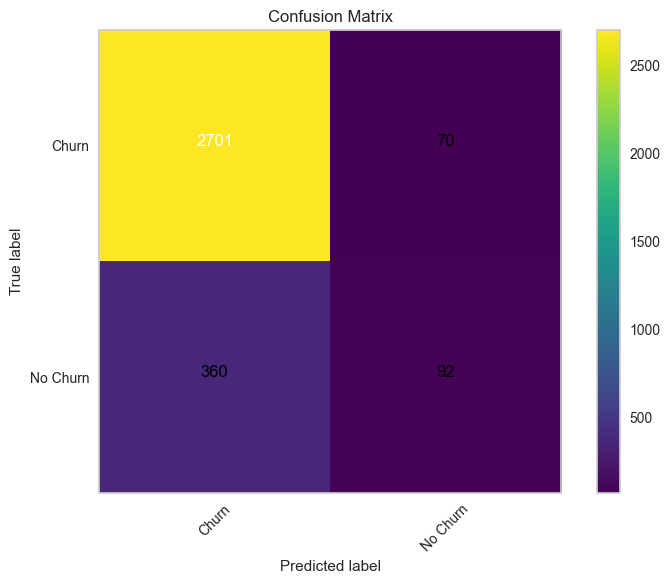

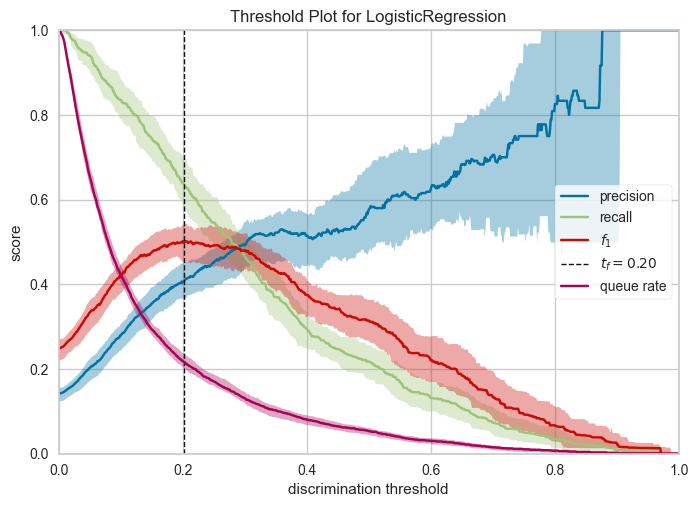

In [36]:
from sklearn.linear_model import LogisticRegression

#Baseline model        
logit = LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                           intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
                           penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
                           verbose=0, warm_start=False)

telecom_churn_prediction(logit, x_train, x_test, y_train, y_test, "coefficients", threshold_plot=True)

Decision Tree Classifier

In [37]:
def treeplot(classifier, cols, classnames):
    graph = Source(tree.export_graphviz(classifier, out_file=None, 
                                        rounded=True, proportion=False,
                                        feature_names = cols, 
                                        precision = 2,
                                        class_names = classnames,
                                        filled = True)
                  )
    display(graph)

Algorithm: DecisionTreeClassifier

Classification report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98      2771
           1       0.97      0.79      0.87       452

    accuracy                           0.97      3223
   macro avg       0.97      0.89      0.93      3223
weighted avg       0.97      0.97      0.97      3223

Accuracy Score: 0.9671113869066087
Area under curve: 0.8947781702398099 



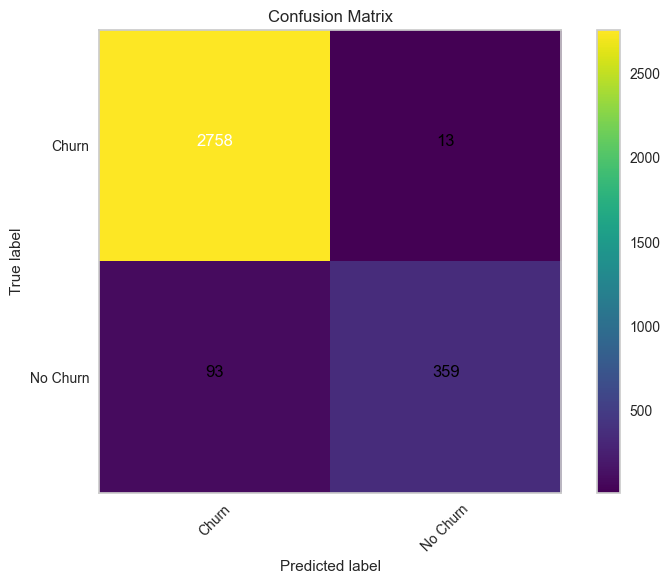

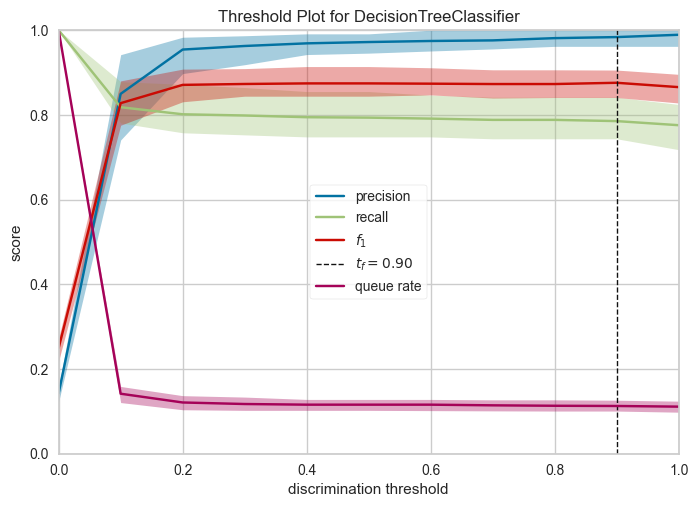

In [38]:
from sklearn.tree import DecisionTreeClassifier
decision_tree = DecisionTreeClassifier(max_depth = 9, random_state = 123,
                                       splitter = "best", criterion = "gini")

telecom_churn_prediction(decision_tree, x_train, x_test, y_train, y_test, "features", threshold_plot=True)

KNN Classifier

Algorithm: KNeighborsClassifier

Classification report:
               precision    recall  f1-score   support

           0       0.92      0.97      0.94      2771
           1       0.72      0.48      0.58       452

    accuracy                           0.90      3223
   macro avg       0.82      0.73      0.76      3223
weighted avg       0.89      0.90      0.89      3223

Accuracy Score: 0.9013341607198262
Area under curve: 0.7269192138552582 



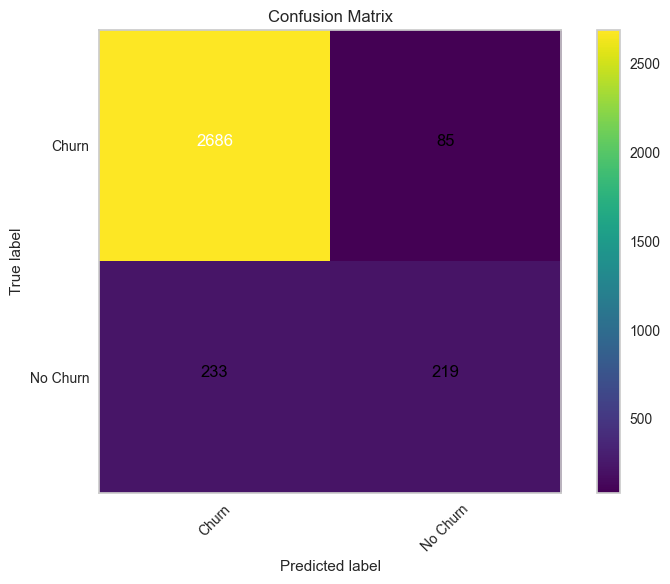

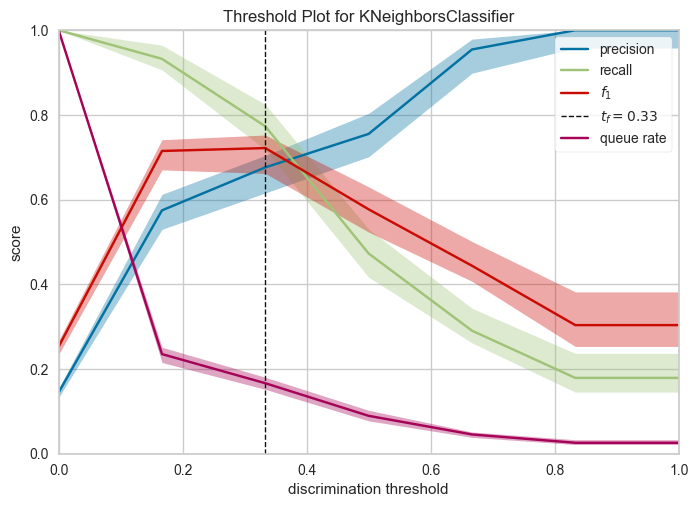

In [39]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                           metric_params=None, n_jobs=1, n_neighbors=5, p=2,
                           weights='uniform')
telecom_churn_prediction(knn, x_train, x_test, y_train, y_test, 'None', threshold_plot=True)

Random Forest Classifier

Algorithm: RandomForestClassifier

Classification report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98      2771
           1       0.98      0.75      0.85       452

    accuracy                           0.96      3223
   macro avg       0.97      0.87      0.91      3223
weighted avg       0.96      0.96      0.96      3223

Accuracy Score: 0.9627676078188023
Area under curve: 0.8728111636641193 



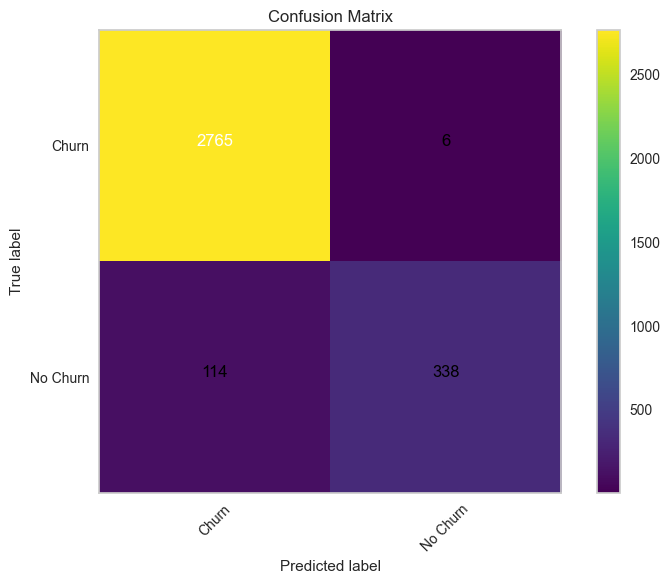

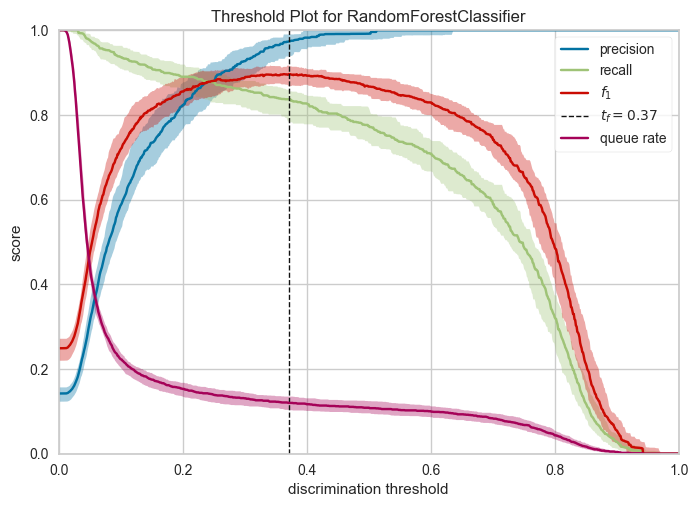

In [40]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators = 100, random_state = 123,
                             max_depth = 9, criterion = "gini")

telecom_churn_prediction(rfc, x_train, x_test, y_train, y_test, 'features', threshold_plot=True)

Using Deeplearning

In [41]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [42]:
model=Sequential()
model.add(Dense(512,activation='relu'))
model.add(Dense(512,activation='relu'))
model.add(Dense(512,activation='relu'))
model.add(Dense(512,activation='relu'))
model.add(Dense(1,activation='sigmoid'))

In [43]:
model.compile(loss='binary_crossentropy',optimizer="adam",metrics=["accuracy"])

In [44]:
history = model.fit(x_train,y_train,epochs=5,batch_size=50,verbose=1)

Epoch 1/5
194/194 [==============================] - 4s 14ms/step - loss: 0.2829 - accuracy: 0.8976
Epoch 2/5
194/194 [==============================] - 3s 16ms/step - loss: 0.1797 - accuracy: 0.9393
Epoch 3/5
194/194 [==============================] - 3s 18ms/step - loss: 0.1411 - accuracy: 0.9563
Epoch 4/5
194/194 [==============================] - 3s 15ms/step - loss: 0.1089 - accuracy: 0.9652
Epoch 5/5
194/194 [==============================] - 3s 14ms/step - loss: 0.0897 - accuracy: 0.9725


In [45]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               7168      
                                                                 
 dense_1 (Dense)             (None, 512)               262656    
                                                                 
 dense_2 (Dense)             (None, 512)               262656    
                                                                 
 dense_3 (Dense)             (None, 512)               262656    
                                                                 
 dense_4 (Dense)             (None, 1)                 513       
                                                                 
Total params: 795,649
Trainable params: 795,649
Non-trainable params: 0
_________________________________________________________________


In [46]:
scores=model.evaluate(x_train,y_train)

303/303 [==============================] - 2s 4ms/step - loss: 0.0671 - accuracy: 0.9776


In [47]:
print("%s: %.2f%%" % (model.metrics_names[1],scores[1]*100))

accuracy: 97.76%


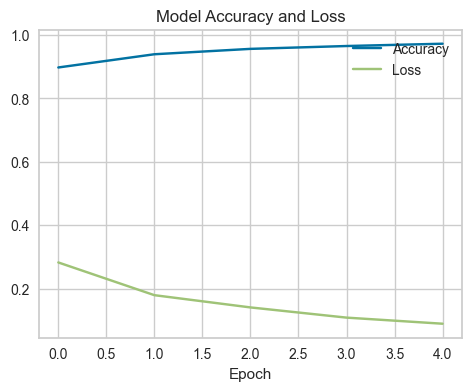

In [48]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['loss'])
plt.title('Model Accuracy and Loss')
plt.xlabel('Epoch')
plt.legend(['Accuracy', 'Loss'], loc='upper right')
plt.show()

In [49]:
y_pred = model.predict(x_test)
y_pred = (y_pred > 0.5).astype(int)

101/101 [==============================] - 1s 4ms/step


In [50]:
accuracy = accuracy_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)

In [51]:
confusion = confusion_matrix(y_test, y_pred)

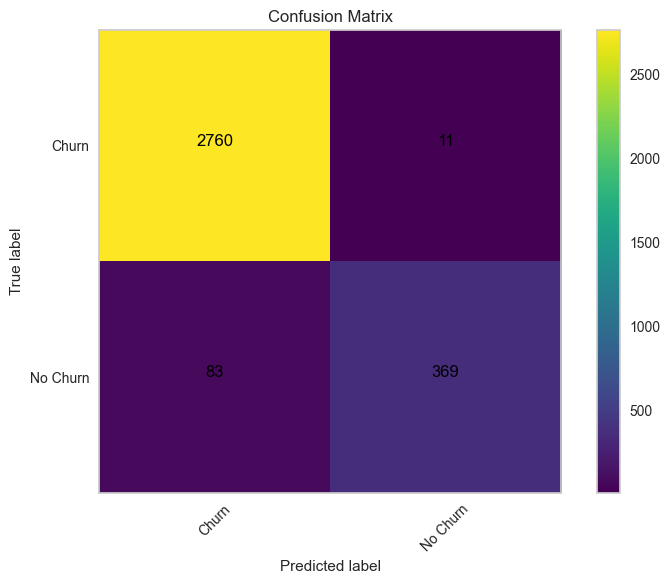

In [52]:
class_names = ['Churn', 'No Churn']
plt.figure(figsize=(8, 6))
plt.imshow(confusion, interpolation='nearest', cmap=plt.get_cmap('viridis'))
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

thresh = confusion.max() / 2.0

for i, j in itertools.product(range(confusion.shape[0]), range(confusion.shape[1])):
    plt.text(j, i, format(confusion[i, j], 'd'),
            horizontalalignment="center",
            color="black" if confusion[i, j] > thresh else "black")

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.grid(False)
plt.tight_layout()
plt.show()

In [53]:
total_agreements = sum(confusion.diagonal())
total_samples = len(y_train)
observed_agreements = total_agreements / total_samples
expected_agreements = sum(confusion.sum(axis=0) * confusion.sum(axis=1)) / (total_samples ** 2)
kappa = (observed_agreements - expected_agreements) / (1 - expected_agreements)

In [54]:
nn_results = {"Model"         : 'Deep Neural Network',
            "Accuracy"        : accuracy,
            "Recall"          : recall,
            "Precision"       : precision,
            "f1-score"        : f1,
            "Roc_auc"         : roc_auc,
            "Kappa_metric"    : kappa,
            }
nn_results_df = pd.DataFrame([nn_results])

Models Perfromance

In [55]:
models = {'Logistic Regression': [logit, cols],
          'Decision Tree': [decision_tree, cols], 
          'KNN Classifier': [knn, cols], 
          'Random Forest': [rfc, cols],
         }

In [56]:
def model_report(model, training_x, testing_x, training_y, testing_y, name):
    model = model.fit(training_x, training_y)
    predictions = model.predict(testing_x)
    accuracy = accuracy_score(testing_y, predictions)
    recallscore = recall_score(testing_y, predictions)
    precision = precision_score(testing_y, predictions)
    roc_auc = roc_auc_score(testing_y, predictions)
    f1score = f1_score(testing_y, predictions) 
    kappa_metric = cohen_kappa_score(testing_y, predictions)
    
    df = pd.DataFrame({"Model"           : [name],
                       "Accuracy"        : [accuracy],
                       "Recall"          : [recallscore],
                       "Precision"       : [precision],
                       "f1-score"        : [f1score],
                       "Roc_auc"         : [roc_auc],
                       "Kappa_metric"    : [kappa_metric],
                      })
    return df

In [57]:
model_performances_train = pd.DataFrame() 
for name in models:
    model_performances_train = pd.concat([model_performances_train, model_report(models[name][0], x_train[models[name][1]], x_test[models[name][1]], y_train, y_test, name)], ignore_index=True)

model_performances_train = pd.concat([model_performances_train, nn_results_df], ignore_index=True)

table_train = ff.create_table(np.round(model_performances_train, 5))
py.iplot(table_train)

In [58]:
def output_tracer(df, metric, color):
    rounded_values = df[metric].round(2)

    tracer = go.Bar(y=df["Model"],
                    x=rounded_values,
                    orientation="h",
                    name=metric,
                    marker=dict(line=dict(width=0.7), color=color),
                    text=rounded_values,  
                    textposition="inside",
                    )
    return tracer

def modelmetricsplot(df, title):
    layout = go.Layout(dict(title=title,
                           plot_bgcolor="rgb(243,243,243)",
                           paper_bgcolor="rgb(243,243,243)",
                           xaxis=dict(gridcolor='rgb(255, 255, 255)',
                                      title="metric",
                                      zerolinewidth=1,
                                      ticklen=5, gridwidth=2),
                           yaxis=dict(gridcolor='rgb(255, 255, 255)',
                                      zerolinewidth=1, ticklen=5, gridwidth=2),
                           margin=dict(l=250),
                           height=780
                           )
                      )
    trace1 = output_tracer(df, "Accuracy", "#6699FF")
    trace2 = output_tracer(df, 'Recall', "red")
    trace3 = output_tracer(df, 'Precision', "#33CC99")
    trace4 = output_tracer(df, 'f1-score', "lightgrey")
    trace5 = output_tracer(df, 'Roc_auc', "magenta")
    trace6 = output_tracer(df, 'Kappa_metric', "#FFCC99")

    data = [trace1, trace2, trace3, trace4, trace5, trace6]
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig)

In [59]:
modelmetricsplot(df=model_performances_train, title="Model performances over the training dataset")